In [2]:
import pandas as pd
import nmrglue as ng
import numpy as np

In [18]:
dic, data = ng.bruker.read('/Volumes/CAS9/Aeiwz/Project/Thesis/P_CPMG/84')

# Remove the digital filter
data = ng.bruker.remove_digital_filter(dic, data)
            # Generate PPM scale manually
size = len(data)
sweep_width = dic['acqus']['SW']            # Spectral width in ppm
spectrometer_freq = dic['acqus']['SFO1']    # Spectrometer frequency in MHz
offset = dic['procs']['OFFSET']        

zf_size = int(sweep_width / 0.0005)
data = ng.proc_base.zf_size(data, zf_size)       # Zero fill
data = ng.proc_base.fft(data)        

In [19]:
data, (p0, p1) = ng.process.proc_autophase.autops(data, fn='peak_minima',return_phases=True)

Optimization terminated successfully.
         Current function value: 0.000097
         Iterations: 82
         Function evaluations: 150


In [12]:
ppm = np.linspace(offset, offset - sweep_width, len(data))

In [22]:
data = ng.proc_base.di(data)
data = ng.proc_base.rev(data)

In [23]:
ppm

array([14.50435   , 14.50384998, 14.50334996, ..., -5.5019314 ,
       -5.50243142, -5.50293144])

In [24]:
df = pd.DataFrame(data)
df = df.T
df.columns = ppm

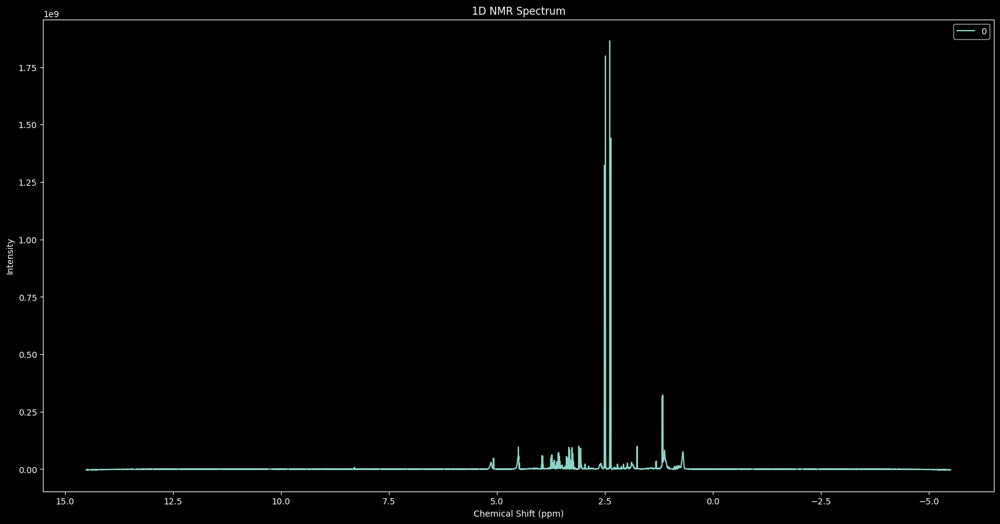

In [25]:
df.T.plot(figsize=(20, 10), title='1D NMR Spectrum', xlabel='Chemical Shift (ppm)', ylabel='Intensity')
#flip plot
import matplotlib.pyplot as plt
plt.gca().invert_xaxis()
plt.savefig('1D_NMR_Spectrum.png', dpi=300)
plt.show()
# Save the DataFrame to a CSV file

In [37]:
import os
from glob import glob
import tqdm
import nmrglue as ng
import pandas as pd
import numpy as np

data_path = '/Volumes/CAS9/Aeiwz/Project/Thesis/Archive'
bin_size = 0.0005
auto_phasing = True
fn_ = 'acme'

print(f"[DEBUG] Checking path: {data_path}")
if not os.path.exists(data_path):
    raise FileNotFoundError(f"Data path '{data_path}' not found.")
if data_path.endswith('/'):
    data_path = data_path[:-1]

sub_dirs = glob(f'{data_path}/*/fid')
print(f"[DEBUG] Found {len(sub_dirs)} FID directories")
if not sub_dirs:
    raise ValueError(f"No 'fid' files found in '{data_path}'. Please check your folder structure.")

dir_ = pd.DataFrame(sub_dirs, columns=['dir'])
dir_['dir'] = dir_['dir'].apply(lambda x: x.replace('\\', '/'))
dir_['folder name'] = dir_['dir'].apply(lambda x: x.split('/')[-2])
dir_['dir'].replace('fid', '', regex=True, inplace=True)

nmr_data = pd.DataFrame()
phase_data = pd.DataFrame(columns=['p0', 'p1'])
dic_list = {}
ppm = None

for i in tqdm.tqdm(dir_.index):
    path_to_process = dir_['dir'][i]
    print(f"[DEBUG] Processing sample {i}: {path_to_process}")

    try:
        dic, data = ng.bruker.read(path_to_process)
    except Exception as e:
        print(f"[ERROR] Reading Bruker data failed: {e}")
        raise

    print("[DEBUG] Removing digital filter")
    data = ng.bruker.remove_digital_filter(dic, data)
    size = len(data)
    sweep_width = dic['acqus']['SW']
    spectrometer_freq = dic['acqus']['SFO1']
    offset = dic['procs']['OFFSET']

    print(f"[DEBUG] ZF size calc: sweep_width={sweep_width}, bin_size={bin_size}")
    zf_size = int(sweep_width / bin_size)
    data = ng.proc_base.zf_size(data, zf_size)
    print(f"[DEBUG] FFT")
    data = ng.proc_base.fft(data)

    if auto_phasing:
        print("[DEBUG] Auto phasing")
        data, (p0, p1) = ng.process.proc_autophase.autops(data, fn=fn_, return_phases=True)
        phase = [p0, p1]
        print(f"[DEBUG] Phase angles: p0={p0}, p1={p1}")
    else:
        pass

    data = ng.proc_base.di(data)
    data = ng.proc_base.rev(data)

    ppm = np.linspace(offset, offset - sweep_width, zf_size)
    print(f"[DEBUG] Generated PPM scale (length={len(ppm)})")

    nmr_data = pd.concat([nmr_data, pd.DataFrame([data.real])], axis=0)
    dic_list.update({dir_['folder name'][i]: dic})
    phase_data = pd.concat([phase_data, pd.DataFrame(phase).T], axis=0)

/var/folders/js/gsdvs9d11jd4g5m9s3xj33c80000gn/T/ipykernel_68698/2744568415.py:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  dir_['dir'].replace('fid', '', regex=True, inplace=True)


[DEBUG] Checking path: /Volumes/CAS9/Aeiwz/Project/Thesis/Archive
[DEBUG] Found 6 FID directories


  0%|          | 0/6 [00:00<?, ?it/s]

[DEBUG] Processing sample 0: /Volumes/CAS9/Aeiwz/Project/Thesis/Archive/61/
[DEBUG] Removing digital filter
[DEBUG] ZF size calc: sweep_width=20.0072814439905, bin_size=0.0005
[DEBUG] FFT
[DEBUG] Auto phasing
Optimization terminated successfully.
         Current function value: 36548.114251
         Iterations: 99
         Function evaluations: 188
[DEBUG] Phase angles: p0=-46.844012705965426, p1=140.14191997496783
[DEBUG] Generated PPM scale (length=40014)


 17%|█▋        | 1/6 [00:00<00:02,  2.28it/s]

[DEBUG] Processing sample 1: /Volumes/CAS9/Aeiwz/Project/Thesis/Archive/51/
[DEBUG] Removing digital filter
[DEBUG] ZF size calc: sweep_width=20.0072814439905, bin_size=0.0005
[DEBUG] FFT
[DEBUG] Auto phasing
Optimization terminated successfully.
         Current function value: 70936.507841
         Iterations: 98
         Function evaluations: 185
[DEBUG] Phase angles: p0=-39.80541148008854, p1=125.8170755306474
[DEBUG] Generated PPM scale (length=40014)


 33%|███▎      | 2/6 [00:00<00:01,  2.51it/s]

[DEBUG] Processing sample 2: /Volumes/CAS9/Aeiwz/Project/Thesis/Archive/21/
[DEBUG] Removing digital filter
[DEBUG] ZF size calc: sweep_width=20.0072814439905, bin_size=0.0005
[DEBUG] FFT
[DEBUG] Auto phasing


 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]

Optimization terminated successfully.
         Current function value: 15195.799669
         Iterations: 106
         Function evaluations: 200
[DEBUG] Phase angles: p0=-46.657816693456596, p1=138.21824477836608
[DEBUG] Generated PPM scale (length=40014)
[DEBUG] Processing sample 3: /Volumes/CAS9/Aeiwz/Project/Thesis/Archive/91/
[DEBUG] Removing digital filter
[DEBUG] ZF size calc: sweep_width=20.0072814439905, bin_size=0.0005
[DEBUG] FFT
[DEBUG] Auto phasing


 67%|██████▋   | 4/6 [00:01<00:00,  2.44it/s]

Optimization terminated successfully.
         Current function value: 27738.161320
         Iterations: 104
         Function evaluations: 196
[DEBUG] Phase angles: p0=-42.939751997740856, p1=139.28761613469413
[DEBUG] Generated PPM scale (length=40014)
[DEBUG] Processing sample 4: /Volumes/CAS9/Aeiwz/Project/Thesis/Archive/101/
[DEBUG] Removing digital filter
[DEBUG] ZF size calc: sweep_width=20.0072814439905, bin_size=0.0005
[DEBUG] FFT
[DEBUG] Auto phasing


 83%|████████▎ | 5/6 [00:02<00:00,  2.58it/s]

Optimization terminated successfully.
         Current function value: 18204.937719
         Iterations: 104
         Function evaluations: 197
[DEBUG] Phase angles: p0=-49.70866831586078, p1=147.20359536770536
[DEBUG] Generated PPM scale (length=40014)
[DEBUG] Processing sample 5: /Volumes/CAS9/Aeiwz/Project/Thesis/Archive/84/
[DEBUG] Removing digital filter
[DEBUG] ZF size calc: sweep_width=20.0072814439905, bin_size=0.0005
[DEBUG] FFT
[DEBUG] Auto phasing


100%|██████████| 6/6 [00:02<00:00,  2.55it/s]

Optimization terminated successfully.
         Current function value: 8293.627316
         Iterations: 102
         Function evaluations: 192
[DEBUG] Phase angles: p0=-51.83868959725633, p1=150.00625969270635
[DEBUG] Generated PPM scale (length=40014)


In [34]:
nmr_data

,0,1,2,3,4,5,6,7,8,9,...,40004,40005,40006,40007,40008,40009,40010,40011,40012,40013
0,-3.436548e+06,-3.500523e+06,-3.425627e+06,-3.421084e+06,-3.489232e+06,-3.498247e+06,-3.701289e+06,-3.491527e+06,-3.539113e+06,-3.379710e+06,...,-3.283706e+06,-3.314305e+06,-3.466799e+06,-3.547872e+06,-3.555948e+06,-3.378501e+06,-3.420553e+06,-3.449077e+06,-3.434969e+06,-3.450453e+06
0,-3.450743e+06,-3.454112e+06,-3.389450e+06,-3.256489e+06,-3.495538e+06,-3.324080e+06,-3.436164e+06,-3.628427e+06,-3.453243e+06,-3.541867e+06,...,-3.561833e+06,-3.581413e+06,-3.577742e+06,-3.521324e+06,-3.664562e+06,-3.578816e+06,-3.505424e+06,-3.555361e+06,-3.592838e+06,-3.825409e+06
0,-2.070792e+06,-2.110999e+06,-2.004517e+06,-2.112419e+06,-2.174434e+06,-2.130090e+06,-2.169359e+06,-2.230081e+06,-2.036808e+06,-2.153932e+06,...,-1.995700e+06,-2.014307e+06,-2.076256e+06,-2.021131e+06,-2.217345e+06,-2.100988e+06,-2.116626e+06,-2.157047e+06,-2.168836e+06,-2.201934e+06
0,-3.390000e+06,-3.345439e+06,-3.340652e+06,-3.423657e+06,-3.423527e+06,-3.450833e+06,-3.553737e+06,-3.577604e+06,-3.454344e+06,-3.445627e+06,...,-3.684961e+06,-3.560465e+06,-3.643515e+06,-3.404887e+06,-3.318811e+06,-3.513249e+06,-3.342038e+06,-3.516311e+06,-3.549075e+06,-3.597739e+06
0,-2.980703e+06,-3.043882e+06,-2.964219e+06,-2.982327e+06,-3.060031e+06,-3.003697e+06,-3.007225e+06,-3.036201e+06,-3.023385e+06,-2.861569e+06,...,-2.931887e+06,-2.954790e+06,-3.098362e+06,-2.853776e+06,-3.063391e+06,-2.891629e+06,-2.982669e+06,-2.928543e+06,-3.050919e+06,-2.913995e+06
0,-3.263701e+06,-3.244979e+06,-3.084669e+06,-3.110243e+06,-3.190591e+06,-3.159627e+06,-3.368400e+06,-3.182988e+06,-3.213648e+06,-3.125036e+06,...,-3.111248e+06,-3.317888e+06,-3.091350e+06,-3.251878e+06,-3.145558e+06,-3.190793e+06,-3.155451e+06,-3.337420e+06,-3.234836e+06,-3.301864e+06


In [39]:
nmr_data.shape

(6, 40014)

<Axes: title={'center': '1D NMR Spectrum'}, xlabel='Chemical Shift (ppm)', ylabel='Intensity'>

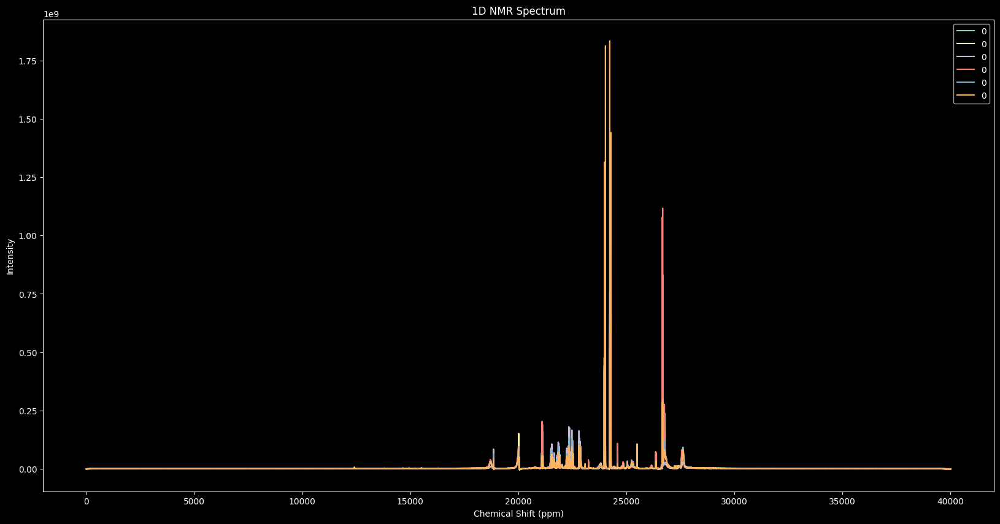

In [38]:
nmr_data.T.plot(figsize=(20, 10), title='1D NMR Spectrum', xlabel='Chemical Shift (ppm)', ylabel='Intensity')

In [ ]:
help(plot_NMR_spec)

In [ ]:
df = nmr.get_data().applymap(lambda x: x.real if isinstance(x, complex) else x)
ppm = nmr.get_ppm()

fig = plot_NMR_spec(spectra=df, ppm=ppm, label=None).single_spectra()

In [ ]:
fig = plot_NMR_spec(spectra=df, ppm=df.columns.astype(float), label=None)

In [40]:
import numpy as np
from scipy import sparse
from scipy.sparse.linalg import spsolve
from scipy.signal import savgol_filter
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from scipy.ndimage import white_tophat, generate_binary_structure

def baseline_correction(y, method='asls', **kwargs):
    """
    Apply baseline correction using selected method.

    Parameters:
        y : array-like
            Input signal.
        method : str
            Method name: 'asls', 'whittaker', 'polynomial', or 'tophat'.
        **kwargs : dict
            Additional parameters for each method.

    Returns:
        baseline : array-like
            Estimated baseline.
    """
    y = np.asarray(y)

    if method == 'asls':
        lam = kwargs.get('lam', 1e6)
        p = kwargs.get('p', 0.001)
        niter = kwargs.get('niter', 10)
        L = len(y)
        D = sparse.diags([1, -2, 1], [0, -1, -2], shape=(L, L-2)).T
        w = np.ones(L)
        for _ in range(niter):
            W = sparse.spdiags(w, 0, L, L)
            Z = W + lam * D.dot(D.T)
            z = spsolve(Z, w * y)
            w = p * (y > z) + (1 - p) * (y < z)
        return z

    elif method == 'whittaker':
        lam = kwargs.get('lam', 1e6)
        L = len(y)
        D = sparse.diags([1, -2, 1], [0, -1, -2], shape=(L, L-2)).T
        W = sparse.eye(L)
        Z = W + lam * D.dot(D.T)
        z = spsolve(Z, y)
        return z

    elif method == 'polynomial':
        degree = kwargs.get('degree', 3)
        x = np.arange(len(y)).reshape(-1, 1)
        poly = PolynomialFeatures(degree)
        X_poly = poly.fit_transform(x)
        model = LinearRegression().fit(X_poly, y)
        baseline = model.predict(X_poly)
        return baseline

    elif method == 'tophat':
        size = kwargs.get('size', 51)  # must be odd and suitable for peak width
        structure = generate_binary_structure(1, 1)
        baseline = white_tophat(y, structure=structure, size=size)
        return y - baseline  # tophat removes baseline directly

    else:
        raise ValueError(f"Unknown method: {method}")

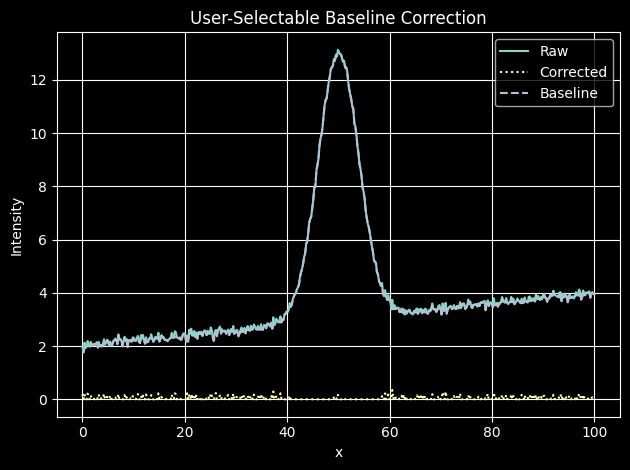

In [52]:
import numpy as np
from scipy import sparse
from scipy.sparse.linalg import spsolve
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from scipy.ndimage import white_tophat, generate_binary_structure
import matplotlib.pyplot as plt

def baseline_correction(y, method='asls', **kwargs):
    """
    Apply baseline correction using selected method.

    Parameters:
        y : array-like
            Input signal.
        method : str
            Method name: 'asls', 'whittaker', 'polynomial', or 'tophat'.
        **kwargs : dict
            Additional parameters for each method.

    Returns:
        baseline : array-like
            Estimated baseline.
    """
    y = np.asarray(y)

    if method == 'asls':
        lam = kwargs.get('lam', 1e6)
        p = kwargs.get('p', 0.001)
        niter = kwargs.get('niter', 10)
        L = len(y)
        D = sparse.diags([1, -2, 1], [0, -1, -2], shape=(L-2, L))
        w = np.ones(L)
        for _ in range(niter):
            W = sparse.spdiags(w, 0, L, L)
            Z = W + lam * D.T.dot(D)
            z = spsolve(Z, w * y)
            w = p * (y > z) + (1 - p) * (y < z)
        return z

    elif method == 'whittaker':
        lam = kwargs.get('lam', 1e6)
        L = len(y)
        D = sparse.diags([1, -2, 1], [0, -1, -2], shape=(L-2, L))
        W = sparse.eye(L)
        Z = W + lam * D.T.dot(D)
        z = spsolve(Z, y)
        return z

    elif method == 'polynomial':
        degree = kwargs.get('degree', 3)
        x = np.arange(len(y)).reshape(-1, 1)
        poly = PolynomialFeatures(degree)
        X_poly = poly.fit_transform(x)
        model = LinearRegression().fit(X_poly, y)
        baseline = model.predict(X_poly)
        return baseline

    elif method == 'tophat':
        size = kwargs.get('size', 51)  # Must be odd
        structure = generate_binary_structure(1, 1)
        baseline = white_tophat(y, structure=structure, size=size)
        return y - baseline  # tophat removes baseline directly

    else:
        raise ValueError(f"Unknown method: {method}")

# ---------------------- Example ----------------------

# Simulate signal
x = np.linspace(0, 100, 500)
baseline_true = 0.02 * x + 2
signal = np.exp(-0.5 * ((x - 50) / 4)**2) * 10
noise = np.random.normal(0, 0.1, size=x.shape)
y = signal + baseline_true + noise

# Choose a method: 'asls', 'whittaker', 'polynomial', or 'tophat'
baseline = baseline_correction(y, method='tophat', lam=1e5, p=0.01)
corrected = y - baseline

# Plot
plt.plot(x, y, label='Raw')
plt.plot(x, corrected, label='Corrected', linestyle=':')
plt.plot(x, baseline, label='Baseline', linestyle='--')

plt.legend()
plt.title("User-Selectable Baseline Correction")
plt.xlabel("x")
plt.ylabel("Intensity")
plt.grid(True)
plt.tight_layout()
plt.show()

In [60]:
def auto_baseline_nmr(y, methods=None, return_all=False):
    """
    Automatically select the best baseline correction for NMR data.

    Parameters:
        y : 1D array
            Input NMR spectrum.
        methods : dict or None
            Dictionary of methods and parameters to try.
        return_all : bool
            If True, return all results (debugging).

    Returns:
        best_baseline : array
        best_method : str
        (optional) results_dict : dict of {method: (baseline, score)}
    """
    if methods is None:
        methods = {
            'asls': {'lam': 1e6, 'p': 0.001},
            'whittaker': {'lam': 1e6},
            'polynomial': {'degree': 3}
        }

    results = {}
    best_score = np.inf
    best_baseline = None
    best_method = None

    for method, params in methods.items():
        try:
            baseline = baseline_correction(y, method=method, **params)
            corrected = y - baseline

            # NMR-specific: mask peak regions
            std = np.std(corrected)
            mask = np.abs(corrected) < 1.5 * std  # keep mostly flat regions
            score = np.std(corrected[mask])

            results[method] = (baseline, score)
            if score < best_score:
                best_score = score
                best_baseline = baseline
                best_method = method

        except Exception as e:
            print(f"Method {method} failed: {e}")

    if return_all:
        return best_baseline, best_method, results
    return best_baseline, best_method

/var/folders/js/gsdvs9d11jd4g5m9s3xj33c80000gn/T/ipykernel_68698/2226471336.py:37: MatrixRankWarning: Matrix is exactly singular
  z = spsolve(Z, w * y)
/opt/homebrew/lib/python3.12/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/homebrew/lib/python3.12/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/opt/homebrew/lib/python3.12/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


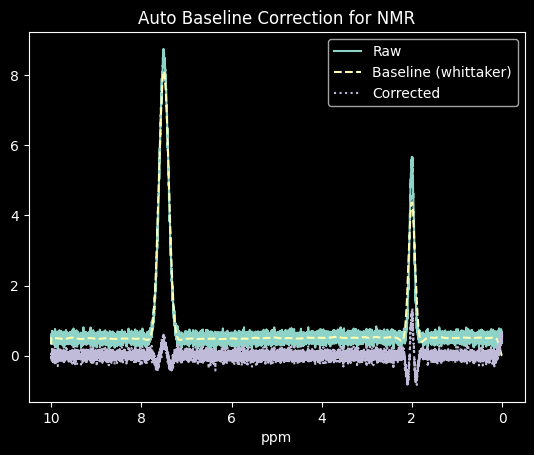

In [61]:
# Simulated NMR-like spectrum
x = np.linspace(0, 10, 8000)
signal = (
    np.exp(-0.5 * ((x - 2) / 0.05)**2) * 5 +
    np.exp(-0.5 * ((x - 7.5) / 0.1)**2) * 8
)
baseline_true = 0.02 * np.sin(2 * np.pi * x / 10) + 0.5
noise = np.random.normal(0, 0.1, size=x.shape)
y = signal + baseline_true + noise

# Auto baseline correction
baseline, method = auto_baseline_nmr(y)
corrected = y - baseline

# Plot
import matplotlib.pyplot as plt
plt.plot(x, y, label='Raw')
plt.plot(x, baseline, label=f'Baseline ({method})', linestyle='--')
plt.plot(x, corrected, label='Corrected', linestyle=':')
plt.legend()
plt.title("Auto Baseline Correction for NMR")
plt.xlabel("ppm")
plt.gca().invert_xaxis()  # Typical for NMR
plt.show()

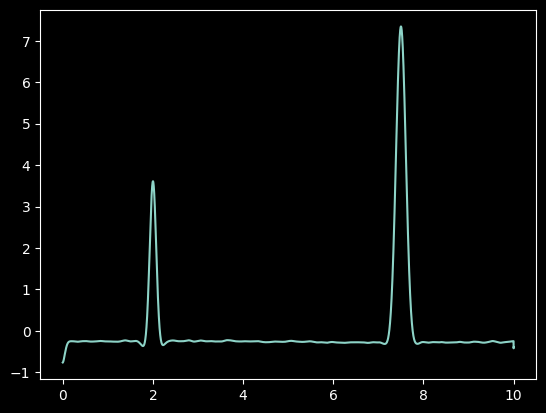

In [62]:
residual = baseline - baseline.mean()
plt.plot(x, residual)

/var/folders/js/gsdvs9d11jd4g5m9s3xj33c80000gn/T/ipykernel_68698/3486842539.py:28: MatrixRankWarning: Matrix is exactly singular
  z = spsolve(Z, w * y)


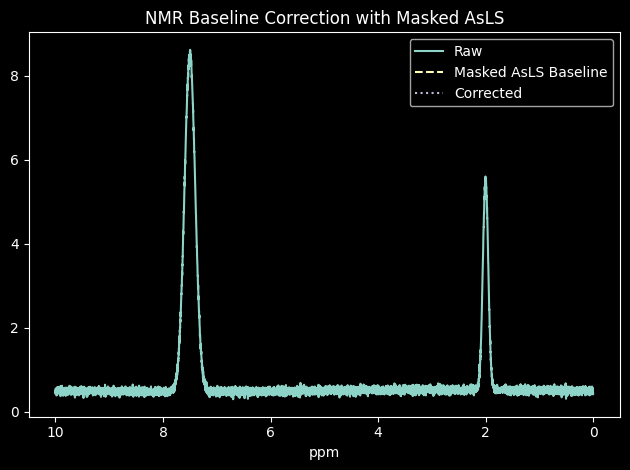

In [63]:
import numpy as np
from scipy import sparse
from scipy.sparse.linalg import spsolve
from scipy.signal import find_peaks
import matplotlib.pyplot as plt

def detect_baseline_mask(y, threshold_factor=1.5):
    """
    Detect flat baseline regions by thresholding low-intensity zones.
    """
    y = np.asarray(y)
    threshold = np.percentile(np.abs(y), 20) * threshold_factor
    mask = np.abs(y) < threshold
    return mask

def masked_asls(y, mask, lam=1e6, p=0.001, niter=10):
    """
    AsLS baseline correction with masked regions (e.g., peaks).
    """
    y = np.asarray(y)
    L = len(y)
    D = sparse.diags([1, -2, 1], [0, -1, -2], shape=(L-2, L))
    w = np.where(mask, 1.0, 0.001)  # suppress peaks during fitting

    for _ in range(niter):
        W = sparse.spdiags(w, 0, L, L)
        Z = W + lam * D.T @ D
        z = spsolve(Z, w * y)
        w = np.where(mask, p * (y > z) + (1 - p) * (y < z), 0.001)
    return z

# ---------------- Example ----------------

# Simulate NMR-like signal
x = np.linspace(0, 10, 8000)
signal = (
    np.exp(-0.5 * ((x - 2) / 0.05)**2) * 5 +
    np.exp(-0.5 * ((x - 7.5) / 0.1)**2) * 8
)
baseline_true = 0.02 * np.sin(2 * np.pi * x / 10) + 0.5
noise = np.random.normal(0, 0.05, size=x.shape)
y = signal + baseline_true + noise

# Detect baseline mask
mask = detect_baseline_mask(y, threshold_factor=1.2)

# Perform masked baseline correction
baseline = masked_asls(y, mask, lam=1e6, p=0.001)
corrected = y - baseline

# Plot
plt.plot(x, y, label="Raw")
plt.plot(x, baseline, label="Masked AsLS Baseline", linestyle='--')
plt.plot(x, corrected, label="Corrected", linestyle=':')
plt.title("NMR Baseline Correction with Masked AsLS")
plt.xlabel("ppm")
plt.gca().invert_xaxis()
plt.legend()
plt.tight_layout()
plt.show()

/var/folders/js/gsdvs9d11jd4g5m9s3xj33c80000gn/T/ipykernel_68698/3486842539.py:28: MatrixRankWarning: Matrix is exactly singular
  z = spsolve(Z, w * y)


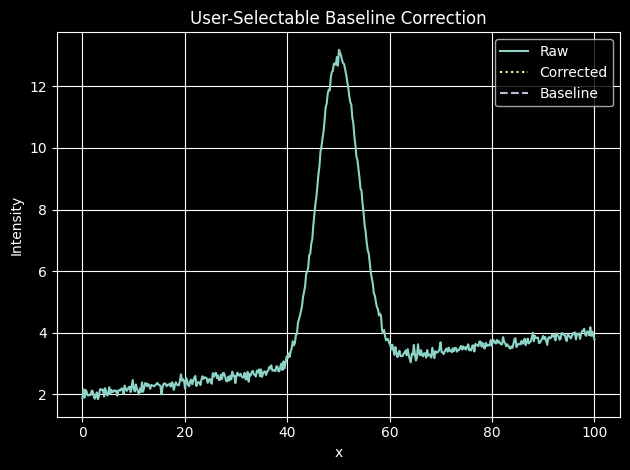

In [72]:
# Simulate signal
x = np.linspace(0, 100, 500)
baseline_true = 0.02 * x + 2
signal = np.exp(-0.5 * ((x - 50) / 4)**2) * 10
noise = np.random.normal(0, 0.1, size=x.shape)
y = signal + baseline_true + noise


mask = detect_baseline_mask(y, threshold_factor=1.6)
# Choose a method: 'asls', 'whittaker', 'polynomial', or 'tophat'
baseline = masked_asls(y, mask, lam=1e6, p=0.001)
corrected = y - baseline

# Plot
plt.plot(x, y, label='Raw')
plt.plot(x, corrected, label='Corrected', linestyle=':')
plt.plot(x, baseline, label='Baseline', linestyle='--')

plt.legend()
plt.title("User-Selectable Baseline Correction")
plt.xlabel("x")
plt.ylabel("Intensity")
plt.grid(True)
plt.tight_layout()
plt.show()

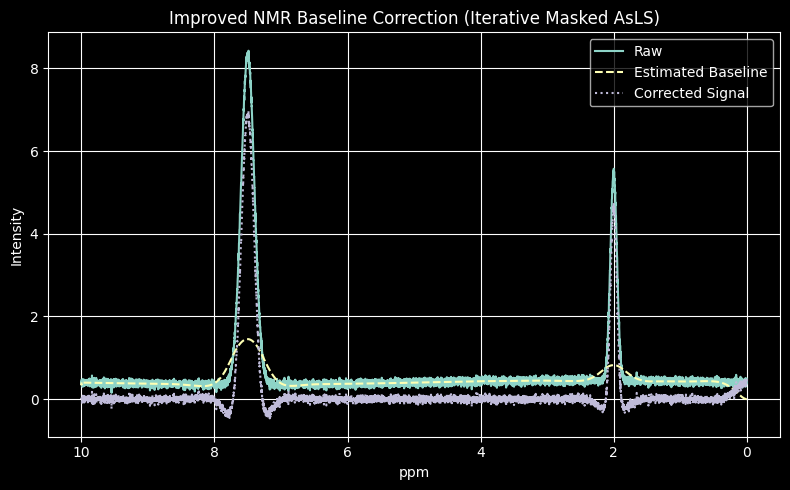

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import sparse
from scipy.sparse.linalg import spsolve

def iterative_masked_asls(y, lam=1e8, p=0.001, niter=10, peak_threshold=1.5):
    """
    Improved baseline correction using AsLS with iterative peak masking.

    Parameters:
        y : 1D array
            Input NMR spectrum.
        lam : float
            Smoothness (higher = smoother baseline).
        p : float
            Asymmetry parameter (0 < p < 1).
        niter : int
            Number of iterations.
        peak_threshold : float
            Threshold for masking peaks (in std units above baseline).

    Returns:
        baseline : 1D array
            Estimated baseline.
    """
    y = np.asarray(y)
    L = len(y)
    D = sparse.diags([1, -2, 1], [0, -1, -2], shape=(L-2, L))
    baseline = np.zeros_like(y)
    mask = np.ones(L, dtype=bool)

    for _ in range(niter):
        w = np.where(mask, 1.0, 0.01)
        W = sparse.spdiags(w, 0, L, L)
        Z = W + lam * D.T.dot(D)
        baseline = spsolve(Z, w * y)

        diff = y - baseline
        std = np.std(diff)
        mask = diff < (peak_threshold * std)

    return baseline

# ---------------- Example with Simulated NMR ----------------

# Simulated NMR-like spectrum
x = np.linspace(0, 10, 8000)
# Sharp peaks (simulate metabolites)
signal = (
    np.exp(-0.5 * ((x - 2) / 0.05)**2) * 5 +
    np.exp(-0.5 * ((x - 7.5) / 0.1)**2) * 8
)
# Broad sinusoidal baseline + noise
baseline_true = 0.05 * np.sin(2 * np.pi * x / 10) + 0.4
noise = np.random.normal(0, 0.05, size=x.shape)
y = signal + baseline_true + noise

# Apply improved baseline correction
baseline = iterative_masked_asls(y, lam=1e8, p=0.001, niter=10, peak_threshold=1.5)
corrected = y - baseline

# Plotting
plt.figure(figsize=(8, 5))
plt.plot(x, y, label="Raw")
plt.plot(x, baseline, label="Estimated Baseline", linestyle='--')
plt.plot(x, corrected, label="Corrected Signal", linestyle=':')
plt.xlabel("ppm")
plt.ylabel("Intensity")
plt.title("Improved NMR Baseline Correction (Iterative Masked AsLS)")
plt.gca().invert_xaxis()  # For NMR convention
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()

In [74]:
def correct_nmr_baseline_hybrid(y, lam=1e8, peak_threshold=1.5, poly_deg=3):
    """
    Hybrid NMR baseline correction: AsLS + polynomial trend on residuals.
    """
    from sklearn.linear_model import LinearRegression
    from sklearn.preprocessing import PolynomialFeatures

    # Step 1: AsLS with peak masking
    baseline_asls = iterative_masked_asls(y, lam=lam, peak_threshold=peak_threshold)
    corrected = y - baseline_asls

    # Step 2: Polynomial fit on flat regions
    std = np.std(corrected)
    mask = np.abs(corrected) < std * 1.5  # flat regions only
    x_idx = np.arange(len(y)).reshape(-1, 1)
    poly = PolynomialFeatures(poly_deg)
    X_poly = poly.fit_transform(x_idx[mask])
    model = LinearRegression().fit(X_poly, corrected[mask])
    fitted_trend = model.predict(poly.transform(x_idx))

    # Final correction
    corrected_final = corrected - fitted_trend
    final_baseline = baseline_asls + fitted_trend
    return final_baseline, corrected_final

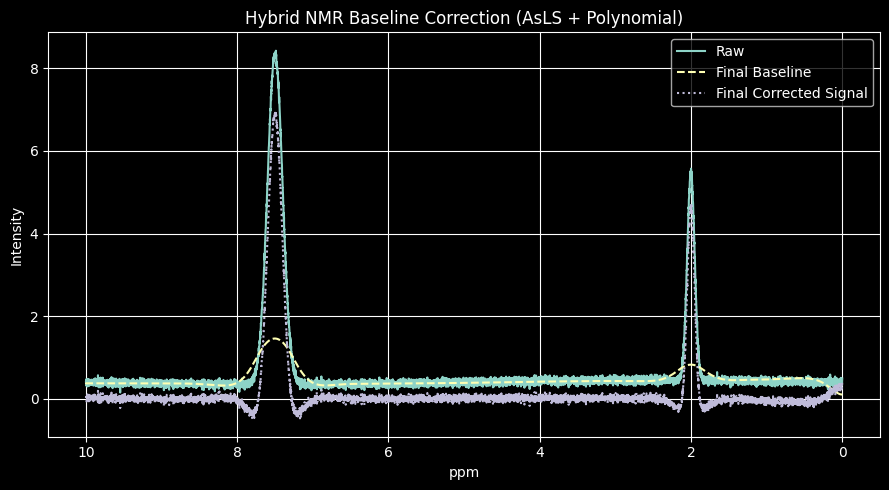

In [75]:
baseline, corrected = correct_nmr_baseline_hybrid(y, lam=1e8, peak_threshold=1.5, poly_deg=3)

# Plot
plt.figure(figsize=(9, 5))
plt.plot(x, y, label="Raw")
plt.plot(x, baseline, label="Final Baseline", linestyle='--')
plt.plot(x, corrected, label="Final Corrected Signal", linestyle=':')
plt.xlabel("ppm")
plt.ylabel("Intensity")
plt.title("Hybrid NMR Baseline Correction (AsLS + Polynomial)")
plt.gca().invert_xaxis()
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()